In [40]:
import pandas as pd
import csv
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


In [14]:
!ls

ATTACK.png             Merged.png             cicids_static_data.csv
Cyber_security.csv     Original.png
HWv2.ipynb             Summer HW.ipynb


In [34]:
wfile = './cicids_static_data.csv'

with open('./cicids_static_data.csv',  encoding='utf-8') as r_file:
    csvreader = csv.reader(r_file)
    num_columns = len(df.columns)

    # Выведите количество столбцов
    print(f"Количество свойств в файле: {num_columns}")

    headers = next(csvreader)
    print(headers)
    
    file = csv.reader(r_file, delimiter = ",")
    
    count = 0
    for row in file:
        if count == 0:
            print(f'Файл содержит значения столбцов: {",".join(row)}')
        count += 1
    print(f'Всего {count} строк') 

Количество столбцов в файле: 79
[' Destination Port', ' Flow Duration', ' Total Fwd Packets', ' Total Backward Packets', 'Total Length of Fwd Packets', ' Total Length of Bwd Packets', ' Fwd Packet Length Max', ' Fwd Packet Length Min', ' Fwd Packet Length Mean', ' Fwd Packet Length Std', 'Bwd Packet Length Max', ' Bwd Packet Length Min', ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean', ' Packet Length Std', ' Packet Length Variance', 'FIN Flag Count', ' SYN Flag Count', ' RST Flag Count', ' PSH Flag Count'

In [16]:
X = []
Y = []
df = pd.read_csv('./cicids_static_data.csv')

counts = df[' Destination Port'].value_counts()
print(counts)

53       9510
443      5088
80       4097
123       255
22        143
         ... 
37625       1
43200       1
61470       1
51811       1
50100       1
Name:  Destination Port, Length: 4713, dtype: int64


53      9510
443     5088
80      4097
123      255
22       143
21        72
137       69
389       53
88        53
465       36
139       31
3268      31
8080      23
445       19
0         16
Name:  Destination Port, dtype: int64
int64


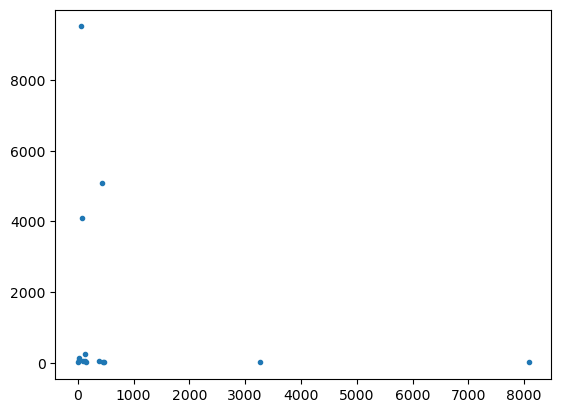

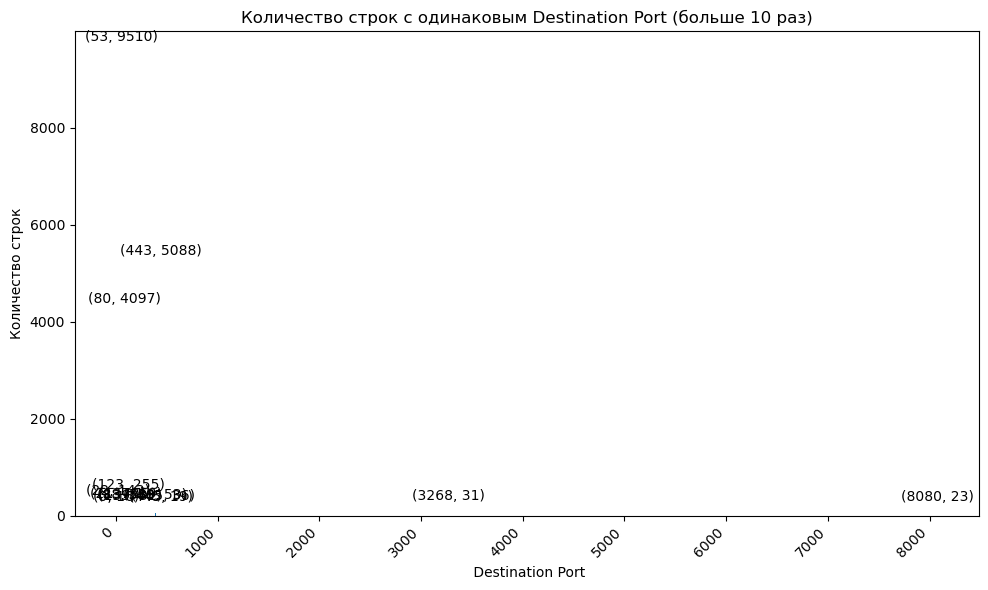

In [17]:
filtered_counts = counts[counts > 10]
print(filtered_counts)
column_types = filtered_counts.dtypes
print(column_types)

plt.plot(filtered_counts, marker='.', linestyle='')
plt.figure(figsize=(10, 6))
plt.bar(filtered_counts.index, filtered_counts.values)
plt.xlabel(' Destination Port')
plt.ylabel('Количество строк')
plt.title('Количество строк с одинаковым Destination Port (больше 10 раз)')
plt.xticks(rotation=45, ha='right')  # Поворот подписей по оси X для улучшения читаемости
for x, y in zip(filtered_counts.index, filtered_counts.values):
    plt.annotate(f"({x}, {y})", (x, y), textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()
plt.show()

In [18]:
wfile = './cicids_static_data.csv'

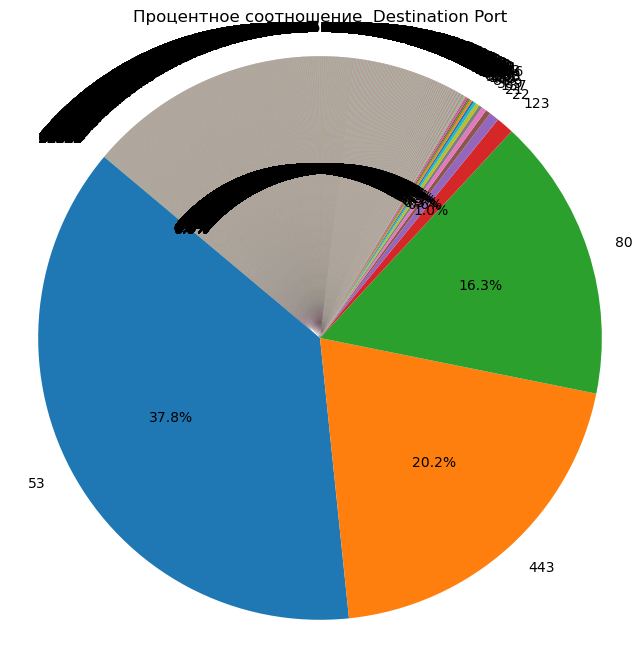

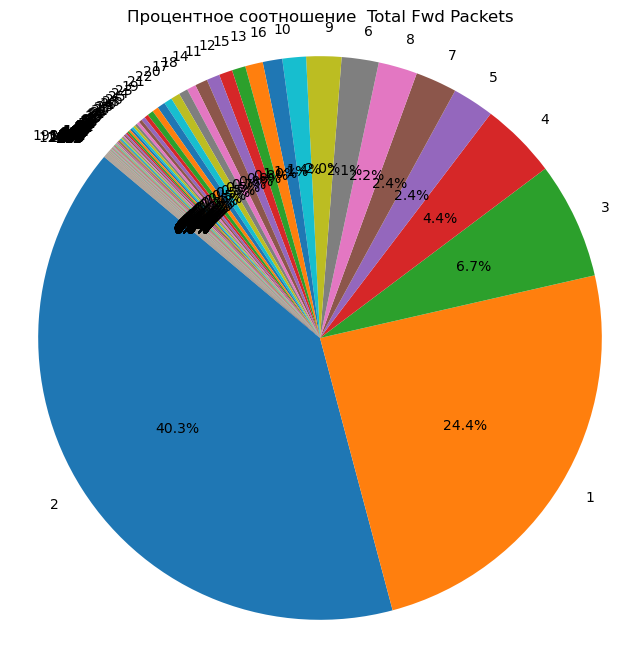

KeyError: ' Total Length of Fwd Packets'

In [19]:
data = pd.read_csv(wfile)
df = pd.DataFrame(data)

def plot_pie_chart(data, column_name):
    
    selected_data = df[column_name]

    # Подсчет количества использований (суммы) для каждого уникального значения параметра
    value_counts = selected_data.value_counts()

    # Подсчет процентного соотношение для каждого уникального значения
    percentage_data = value_counts / value_counts.sum() * 100

    # Постройте круговую диаграмму
    plt.figure(figsize=(8, 8))
    plt.pie(percentage_data, labels=percentage_data.index, autopct='%1.1f%%', startangle=140)
    plt.title(f"Процентное соотношение {column_name}")
    plt.axis('equal')  # Это для того, чтобы круг был круглым
    plt.show()


plot_pie_chart(df, ' Destination Port')
plot_pie_chart(df, ' Total Fwd Packets')
plot_pie_chart(df, ' Total Length of Fwd Packets')

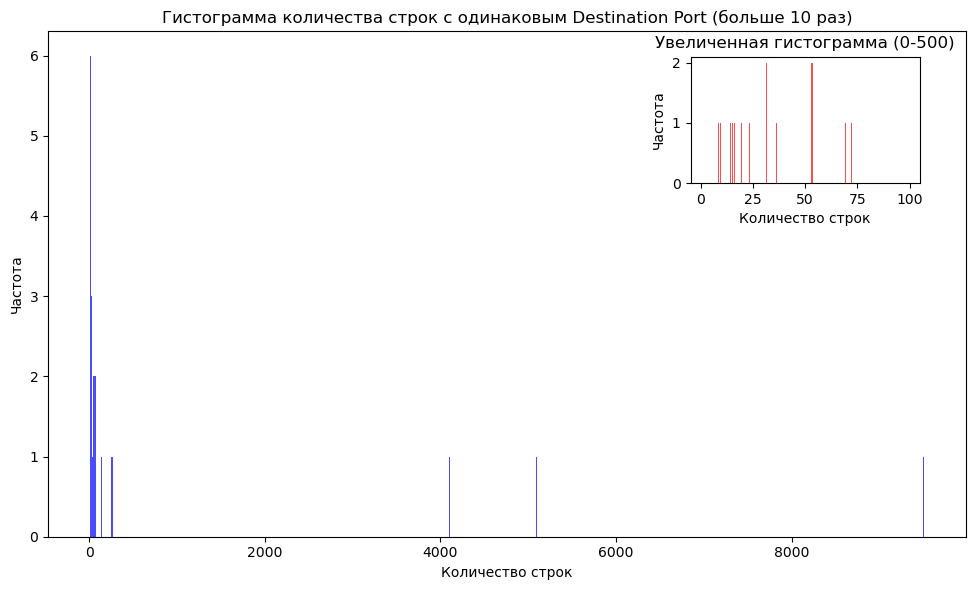

In [31]:
def plot_destination_port_counts(csv_file):
    df = pd.read_csv(csv_file)
    port_counts = df[' Destination Port'].value_counts()
    filtered_counts = port_counts[port_counts > 5]


    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Построение гистограммы для значений, встречающихся более 5 раз
    ax1.hist(filtered_counts.values, bins=700, color='blue', alpha=0.7)
    ax1.set_xlabel('Количество строк')
    ax1.set_ylabel('Частота')
    ax1.set_title('Гистограмма количества строк с одинаковым Destination Port (больше 10 раз)')

    # Создание дополнительной области графика (для второго графика)
    ax2 = ax1.inset_axes([0.7, 0.7, 0.25, 0.25])  # Указываем координаты и размеры дополнительной области
    ax2.hist(filtered_counts.values, bins=200, color='red', alpha=0.7, range=(0, 100))
    ax2.set_xlabel('Количество строк')
    ax2.set_ylabel('Частота')
    ax2.set_title('Увеличенная гистограмма (0-500)')

    # Вывод графика
    plt.tight_layout()
    plt.show()

plot_destination_port_counts(wfile)

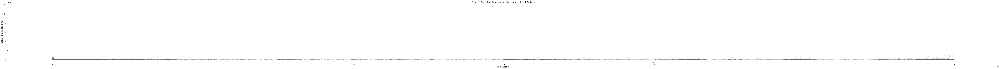

In [38]:


# Загрузка данных из файла cicids_static_data.csv
data = pd.read_csv(wfile)

# Выбор столбцов для анализа
x = data[" Flow Duration"]
y = data["Total Length of Fwd Packets"]

# Создайние диаграммы рассеяния
plt.figure(figsize=(100, 6))
plt.scatter(x, y, alpha=0.2)  # alpha задает прозрачность точек для лучшей видимости


plt.xlabel("Flow Duration")
plt.ylabel("Total Length of Fwd Packets")
plt.title("Scatter Plot: Flow Duration vs. Total Length of Fwd Packets")
plt.savefig('Flow_Duration_vs_Total_Length_of_Fwd_Packets.png', dpi=72) 
plt.show()

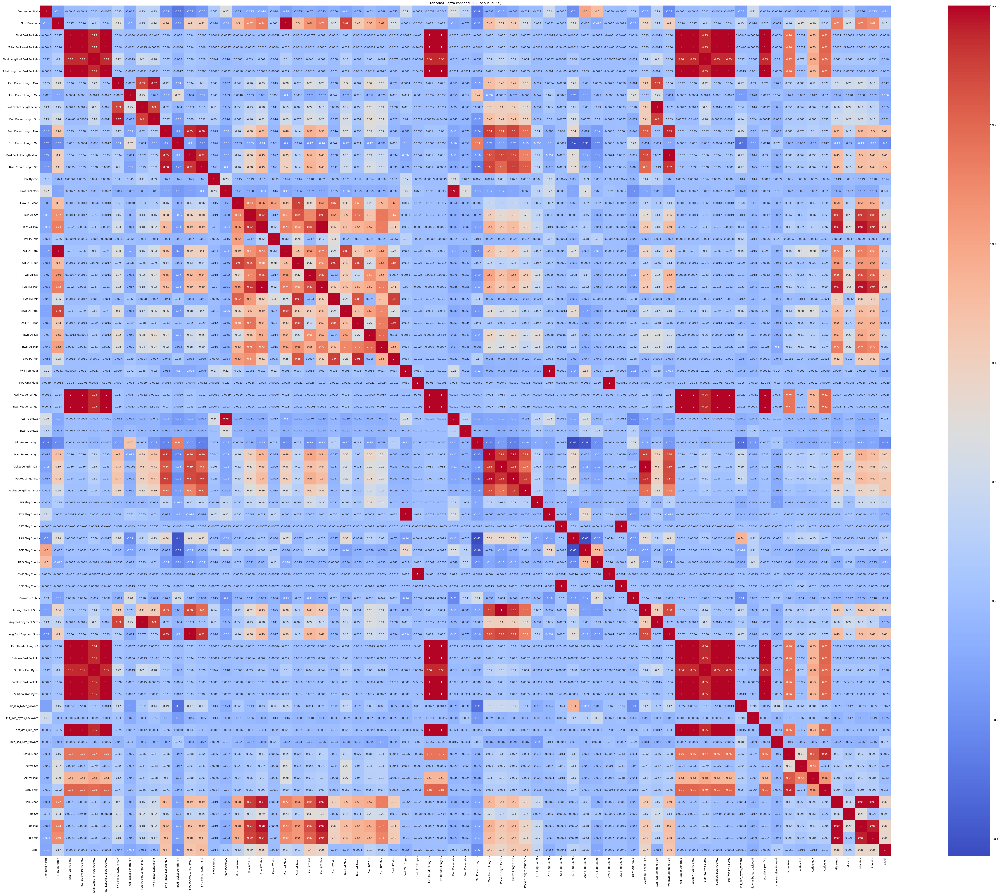

In [16]:


data = pd.read_csv(wfile)
selected_features = headers


# Создаем корреляционную матрицу
data['Label'] = data['Label'].map({'BENIGN': 0, 'ATTACK': 1})
correlation_matrix = data.corr(numeric_only=True)
high_corr_matrix = np.abs(correlation_matrix) 

# Извлекаем признаки все
selected_features = high_corr_matrix.any()

# Получаем подматрицу только с выбранными признаками
filtered_correlation_matrix = correlation_matrix.loc[selected_features, selected_features]

plt.figure(figsize=(80, 60))
sns.heatmap(filtered_correlation_matrix, annot=True, cmap='coolwarm', cbar=True, square=True)
plt.title('Тепловая карта корреляции (Все значения )')
plt.savefig('Original.png', dpi=72) 
plt.show()

In [17]:
high_correlation_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.99:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(pair)

# Выводим пары с корреляцией больше 0.99
for pair in high_correlation_pairs:
    print(f"Корреляция между {pair[0]} и {pair[1]}: {correlation_matrix.loc[pair[0], pair[1]]}")

Корреляция между  Flow Duration и Fwd IAT Total: 0.997988507003309
Корреляция между  Total Fwd Packets и  Total Backward Packets: 0.9997281361458807
Корреляция между  Total Fwd Packets и  Total Length of Bwd Packets: 0.9997531696772415
Корреляция между  Total Fwd Packets и  Fwd Header Length: 0.9996785883476744
Корреляция между  Total Fwd Packets и  Bwd Header Length: 0.9996905458538954
Корреляция между  Total Fwd Packets и  Fwd Header Length.1: 0.9996785883476744
Корреляция между  Total Fwd Packets и Subflow Fwd Packets: 1.0
Корреляция между  Total Fwd Packets и  Subflow Bwd Packets: 0.9997281361458807
Корреляция между  Total Fwd Packets и  Subflow Bwd Bytes: 0.9997540000947832
Корреляция между  Total Fwd Packets и  act_data_pkt_fwd: 0.9980280504350334
Корреляция между  Total Backward Packets и  Total Length of Bwd Packets: 0.9999672658694486
Корреляция между  Total Backward Packets и  Fwd Header Length: 0.9988843148774721
Корреляция между  Total Backward Packets и  Bwd Header Length:

/var/folders/bq/r08blbjx68ng7gzljltkcyz00000gn/T/ipykernel_6491/3165659286.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


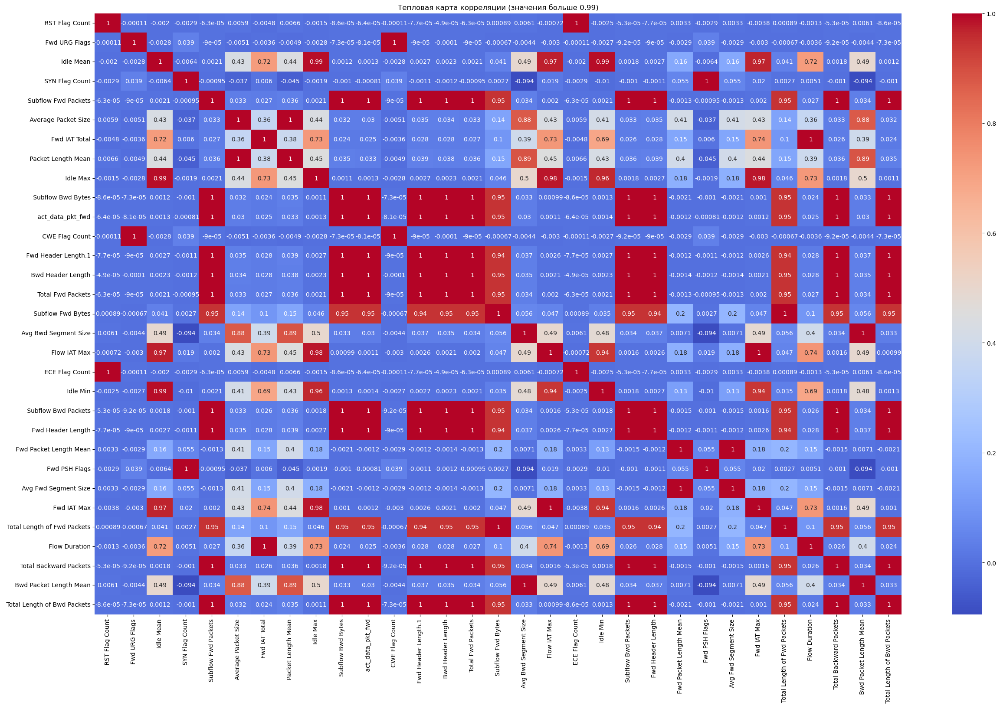

In [102]:
correlation_matrix = data.corr()

# Находим пары параметров с корреляцией больше 0.99
high_correlation_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.99:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(pair)

# Оставляем только параметры с корреляцией больше 0.99
selected_columns = list(set([item for pair in high_correlation_pairs for item in pair]))

# Создаем новый DataFrame с выбранными параметрами
filtered_data = data[selected_columns]

# Строим тепловую карту для оставшихся параметров
filtered_correlation_matrix = filtered_data.corr()

plt.figure(figsize=(30, 18))
sns.heatmap(filtered_correlation_matrix, annot=True, cmap='coolwarm', cbar=True, square=False)
plt.title('Тепловая карта корреляции (значения больше 0.99)')
plt.savefig('Merged.png', dpi=72) 
plt.show()

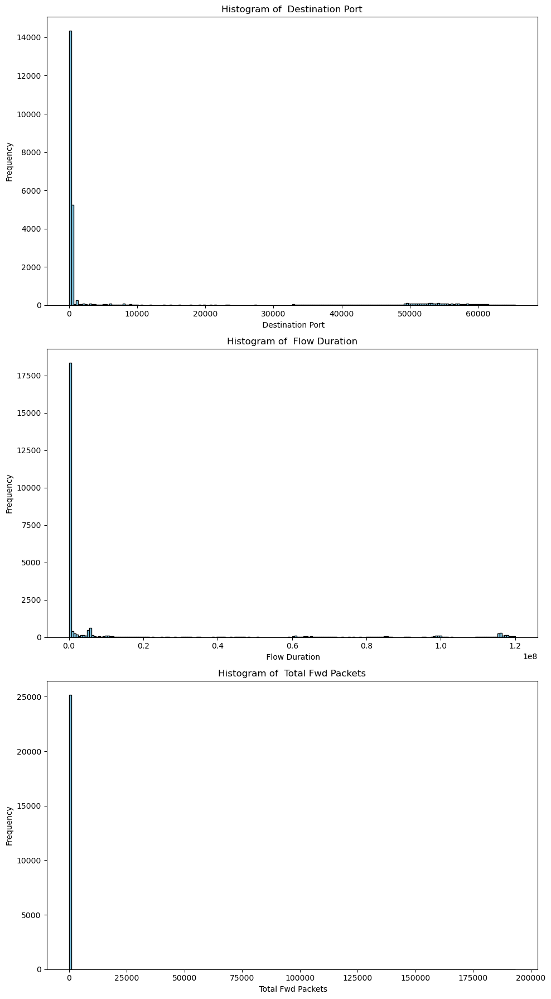

In [62]:
columns_to_plot = [" Destination Port", " Flow Duration", " Total Fwd Packets"]

# Создаем подуровень графиков (subplots)
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(10, 6 * len(columns_to_plot)))

# Построим гистограммы для каждого столбца
for i, column in enumerate(columns_to_plot):
    axes[i].hist(data[column], bins=200, color='skyblue', edgecolor='black')
    axes[i].set_title(f"Histogram of {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

Статистика для 'BENIGN':
        Destination Port   Flow Duration   Total Fwd Packets  \
count       22744.000000    2.274400e+04        22744.000000   
mean         9437.234435    1.122615e+07           15.494812   
std         19780.944235    2.998032e+07         1284.451494   
min             0.000000   -1.000000e+00            1.000000   
25%            53.000000    1.750000e+02            2.000000   
50%            80.000000    3.117400e+04            2.000000   
75%           443.000000    5.586608e+05            4.000000   
max         65464.000000    1.199998e+08       193200.000000   

        Total Backward Packets  Total Length of Fwd Packets  \
count             22744.000000                 2.274400e+04   
mean                 18.277568                 6.300053e+02   
std                1705.208814                 8.161789e+03   
min                   0.000000                 0.000000e+00   
25%                   1.000000                 1.200000e+01   
50%                 

/var/folders/bq/r08blbjx68ng7gzljltkcyz00000gn/T/ipykernel_2819/3679230310.py:20: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix_benign = benign_data.corr()
/var/folders/bq/r08blbjx68ng7gzljltkcyz00000gn/T/ipykernel_2819/3679230310.py:21: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix_attack = attack_data.corr()


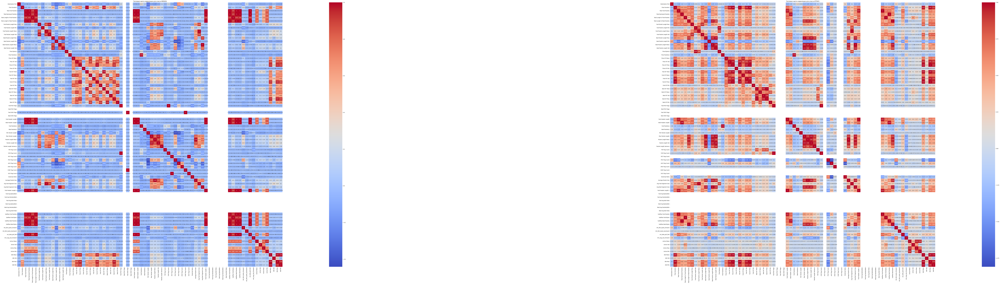

In [41]:

data = pd.read_csv(wfile)
df = pd.DataFrame(data)

# Разделим DataFrame на две подвыборки: 'BENIGN' и 'ATTACK'
benign_data = df[df['Label'] == 'BENIGN']
attack_data = df[df['Label'] == 'ATTACK']

# Анализ статистических показателей для каждой подвыборки
benign_stats = benign_data.describe()
attack_stats = attack_data.describe()

# Вывод статистики для 'BENIGN' и 'ATTACK'
print("Статистика для 'BENIGN':")
print(benign_stats)

print("\nСтатистика для 'ATTACK':")
print(attack_stats)

# Создаем корреляционные матрицы и тепловые карты для каждой подвыборки
correlation_matrix_benign = benign_data.corr()
correlation_matrix_attack = attack_data.corr()

plt.figure(figsize=(200, 36))
plt.subplot(1, 2, 1)
sns.heatmap(correlation_matrix_benign, annot=True, cmap='coolwarm', cbar=True, square=True)
plt.title('Тепловая карта корреляции для класса BENIGN')

plt.subplot(1, 2, 2)
sns.heatmap(correlation_matrix_attack, annot=True, cmap='coolwarm', cbar=True, square=True)
plt.title('Тепловая карта корреляции для класса ATTACK')
plt.savefig('ATTACK.png', dpi=72)
plt.tight_layout()
plt.show()
